# CLuster de Dia





In [64]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from lightgbm import LGBMRegressor, plot_importance
import random
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import gc
import pickle
from sklearn import metrics
from scipy.stats import linregress

from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

import hdbscan
from hdbscan import prediction

from pycaret.clustering import *


In [2]:
usecols = ['game_id', 'user_id', 'bet_id', 'game_type', 'odds', 'fiat_bet_amount',
       'fiat_profit_amount','fiat_is_valuable']


bets_dtypes = {
    'game_id': 'uint32',
    'user_id': 'uint32',
    'bet_id': 'uint64',
    'game_type': 'category',
    'odds': 'float32',
    'fiat_is_valuable': 'category',
    'fiat_bet_amount': 'float32',
    'fiat_profit_amount': 'float32',
}

bets = pd.read_csv("data/bets.csv", usecols=usecols, dtype=bets_dtypes)
bets = bets[bets['fiat_is_valuable'] == 't']


In [3]:
bets.head()


,game_id,user_id,bet_id,game_type,odds,fiat_is_valuable,fiat_bet_amount,fiat_profit_amount
0,2828375,173570,210854317,normal,0.0,t,0.048738,-0.048738
2,2828375,1139219,210854260,normal,2.0,t,0.000088,0.000088
3,2828375,1329183,12148544,yellow,0.0,t,0.188109,-0.188109
4,2828375,1378328,210854292,normal,0.0,t,0.000005,-0.000005
5,2828375,1420292,210854342,normal,3.0,t,0.000107,0.000213


In [4]:
games_usecols = ['game_id', 'max_rate', 'date'] # ,'bet_count']

games_dtypes = {
    'game_id': 'uint32',
    'max_rate': 'float32',
    # 'bet_count': 'uint32',
}

games = pd.read_csv("data/games.csv", usecols=games_usecols, dtype=games_dtypes, parse_dates=['date'])


In [5]:

games.head()


,game_id,max_rate,date
0,2828375,6.430000,2020-09-08 23:30:13
1,2828376,2.100000,2020-09-08 23:30:35
2,2828377,3.110000,2020-09-08 23:31:03
3,2828378,24.969999,2020-09-08 23:32:07
4,2828379,1.040000,2020-09-08 23:32:17


In [6]:
df = pd.merge(bets, games, on='game_id', how='left')



In [7]:
del bets, games
gc.collect()


0

In [8]:
df.sort_values(['user_id','game_id'], kind='stable', inplace=True, ignore_index=True)



In [9]:
df.head()


,game_id,user_id,bet_id,game_type,odds,fiat_is_valuable,fiat_bet_amount,fiat_profit_amount,max_rate,date
0,2831698,44,212042687,normal,1.03,t,0.000034,0.000001,2.370000,2020-09-09 22:51:14
1,2831768,44,212067364,normal,1.03,t,0.000034,0.000001,2.070000,2020-09-09 23:26:45
2,2831820,44,212085405,normal,1.08,t,0.000034,0.000003,1.150000,2020-09-09 23:48:26
3,2832628,44,212376980,normal,1.67,t,0.000035,0.000024,2.060000,2020-09-10 05:36:11
4,2832686,44,212397916,normal,2.00,t,0.000140,0.000140,328.890015,2020-09-10 06:01:38


In [10]:
df.columns


Index(['game_id', 'user_id', 'bet_id', 'game_type', 'odds', 'fiat_is_valuable',
       'fiat_bet_amount', 'fiat_profit_amount', 'max_rate', 'date'],
      dtype='object')

In [11]:
df = df.drop(columns=['fiat_is_valuable'])


In [12]:
df.head(20)


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,date
0,2831698,44,212042687,normal,1.03,0.000034,1.013535e-06,2.370000,2020-09-09 22:51:14
1,2831768,44,212067364,normal,1.03,0.000034,1.013535e-06,2.070000,2020-09-09 23:26:45
2,2831820,44,212085405,normal,1.08,0.000034,2.702760e-06,1.150000,2020-09-09 23:48:26
3,2832628,44,212376980,normal,1.67,0.000035,2.353256e-05,2.060000,2020-09-10 05:36:11
4,2832686,44,212397916,normal,2.00,0.000140,1.404929e-04,328.890015,2020-09-10 06:01:38
5,2832689,44,212399028,normal,0.00,0.000140,-1.404929e-04,1.100000,2020-09-10 06:02:47
6,2832690,44,212399332,normal,2.00,0.000281,2.809858e-04,2.950000,2020-09-10 06:03:14
7,2832691,44,212399705,normal,2.00,0.000140,1.404929e-04,7.670000,2020-09-10 06:03:57
8,2837444,44,214069523,normal,1.03,0.000037,1.102917e-06,3.310000,2020-09-11 15:26:11
9,2843418,44,216156160,normal,1.02,0.000039,7.754470e-07,4.460000,2020-09-13 10:25:25


In [13]:
conditions = [
    (df['game_type'] == 'normal') & (df['odds'] == 0),
    (df['game_type'] == 'green'),
    (df['game_type'] == 'red'),
    (df['game_type'] == 'yellow')
]

values = [
    df['max_rate'],
    2,
    1.96,
    10
]

df['odds_adjusted'] = np.select(conditions, values, default=df['odds'])


In [14]:
df.head()


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,date,odds_adjusted
0,2831698,44,212042687,normal,1.03,0.000034,0.000001,2.370000,2020-09-09 22:51:14,1.03
1,2831768,44,212067364,normal,1.03,0.000034,0.000001,2.070000,2020-09-09 23:26:45,1.03
2,2831820,44,212085405,normal,1.08,0.000034,0.000003,1.150000,2020-09-09 23:48:26,1.08
3,2832628,44,212376980,normal,1.67,0.000035,0.000024,2.060000,2020-09-10 05:36:11,1.67
4,2832686,44,212397916,normal,2.00,0.000140,0.000140,328.890015,2020-09-10 06:01:38,2.00


In [15]:
df.user_id.nunique(), df.game_id.nunique(), df.bet_id.nunique()


(32102, 71499, 23335924)

In [16]:
past_bets = df.groupby("user_id")["fiat_bet_amount"].shift(1)

df["user_bet_mean_weighted"] = (
    past_bets
    .groupby(df["user_id"])
    .transform(lambda s: s.ewm(alpha=0.01, adjust=False).mean())
)
df["user_bet_mean_weighted"] = df["user_bet_mean_weighted"].fillna(
    df.groupby("user_id")["fiat_bet_amount"].transform("first")
)

df["user_bet_amount_proportion"] = df["fiat_bet_amount"] / df["user_bet_mean_weighted"]


In [17]:
df.head(10)


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,date,odds_adjusted,user_bet_mean_weighted,user_bet_amount_proportion
0,2831698,44,212042687,normal,1.03,0.000034,1.013535e-06,2.370000,2020-09-09 22:51:14,1.03,0.000034,1.000000
1,2831768,44,212067364,normal,1.03,0.000034,1.013535e-06,2.070000,2020-09-09 23:26:45,1.03,0.000034,1.000000
2,2831820,44,212085405,normal,1.08,0.000034,2.702760e-06,1.150000,2020-09-09 23:48:26,1.08,0.000034,1.000000
3,2832628,44,212376980,normal,1.67,0.000035,2.353256e-05,2.060000,2020-09-10 05:36:11,1.67,0.000034,1.039625
4,2832686,44,212397916,normal,2.00,0.000140,1.404929e-04,328.890015,2020-09-10 06:01:38,2.00,0.000034,4.156854
5,2832689,44,212399028,normal,0.00,0.000140,-1.404929e-04,1.100000,2020-09-10 06:02:47,1.10,0.000035,4.029644
6,2832690,44,212399332,normal,2.00,0.000281,2.809858e-04,2.950000,2020-09-10 06:03:14,2.00,0.000036,7.822300
7,2832691,44,212399705,normal,2.00,0.000140,1.404929e-04,7.670000,2020-09-10 06:03:57,2.00,0.000038,3.661361
8,2837444,44,214069523,normal,1.03,0.000037,1.102917e-06,3.310000,2020-09-11 15:26:11,1.03,0.000039,0.933260
9,2843418,44,216156160,normal,1.02,0.000039,7.754470e-07,4.460000,2020-09-13 10:25:25,1.02,0.000039,0.984903


In [18]:
gamma = 0.8
delta = 0.2
raw = gamma * np.log(df["odds_adjusted"]) + delta * np.log(df["user_bet_amount_proportion"])
# raw = np.log(df["odds_adjusted"] * df["user_bet_amount_proportion"])

mu = raw.mean()
sd = raw.std() + 1e-12
df["bet_risk"] = (raw - mu) / sd 





In [19]:

df.head(100)


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,date,odds_adjusted,user_bet_mean_weighted,user_bet_amount_proportion,bet_risk
0,2831698,44,212042687,normal,1.03,0.000034,0.000001,2.370000,2020-09-09 22:51:14,1.03,0.000034,1.000000,-0.103505
1,2831768,44,212067364,normal,1.03,0.000034,0.000001,2.070000,2020-09-09 23:26:45,1.03,0.000034,1.000000,-0.103505
2,2831820,44,212085405,normal,1.08,0.000034,0.000003,1.150000,2020-09-09 23:48:26,1.08,0.000034,1.000000,-0.048888
3,2832628,44,212376980,normal,1.67,0.000035,0.000024,2.060000,2020-09-10 05:36:11,1.67,0.000034,1.039625,0.464507
4,2832686,44,212397916,normal,2.00,0.000140,0.000140,328.890015,2020-09-10 06:01:38,2.00,0.000034,4.156854,1.071484
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2828664,5588,12159782,yellow,0.00,7.090167,-7.090167,2.410000,2020-09-09 01:32:42,10.00,4.320677,1.640985,2.658147
96,2828665,5588,12159820,red,0.00,1.772542,-1.772542,7.400000,2020-09-09 01:33:25,1.96,4.348371,0.407633,0.379312
97,2828665,5588,12159822,green,2.00,0.886271,0.886271,7.400000,2020-09-09 01:33:25,2.00,4.322613,0.205031,0.204640
98,2828666,5588,12159859,green,2.00,7.090167,7.090167,3.030000,2020-09-09 01:33:52,2.00,4.288250,1.653394,0.805922


In [20]:
# df['time'] = df['date'].dt.time
df['hour'] = df['date'].dt.hour
# df['day'] = df['date'].dt.date
df['day_of_week'] = df['date'].dt.dayofweek
df['day_of_year'] = df['date'].dt.dayofyear
df['week_of_year'] = df['date'].dt.isocalendar().week





In [21]:
df.head()


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,date,odds_adjusted,user_bet_mean_weighted,user_bet_amount_proportion,bet_risk,hour,day_of_week,day_of_year,week_of_year
0,2831698,44,212042687,normal,1.03,0.000034,0.000001,2.370000,2020-09-09 22:51:14,1.03,0.000034,1.000000,-0.103505,22,2,253,37
1,2831768,44,212067364,normal,1.03,0.000034,0.000001,2.070000,2020-09-09 23:26:45,1.03,0.000034,1.000000,-0.103505,23,2,253,37
2,2831820,44,212085405,normal,1.08,0.000034,0.000003,1.150000,2020-09-09 23:48:26,1.08,0.000034,1.000000,-0.048888,23,2,253,37
3,2832628,44,212376980,normal,1.67,0.000035,0.000024,2.060000,2020-09-10 05:36:11,1.67,0.000034,1.039625,0.464507,5,3,254,37
4,2832686,44,212397916,normal,2.00,0.000140,0.000140,328.890015,2020-09-10 06:01:38,2.00,0.000034,4.156854,1.071484,6,3,254,37


In [22]:
def downcast_df(df: pd.DataFrame) -> pd.DataFrame:
    float_cols = df.select_dtypes(include=['float64','float32']).columns
    df[float_cols] = df[float_cols].astype('float32', copy=False)

    int_cols = df.select_dtypes(include=['int64','int32','int']).columns
    for c in int_cols:
        if df[c].min() >= 0 and df[c].max() <= np.iinfo(np.uint32).max:
            df[c] = df[c].astype('uint32', copy=False)
        else:
            df[c] = df[c].astype('int32', copy=False)


    if 'user_id' in df.columns:
        df['user_id'] = df['user_id'].astype('category')


    if 'game_id' in df.columns:
        df['game_id'] = df['game_id'].astype('category')

    gc.collect()
    return df


In [23]:
df = downcast_df(df)


In [24]:
df.head()


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,date,odds_adjusted,user_bet_mean_weighted,user_bet_amount_proportion,bet_risk,hour,day_of_week,day_of_year,week_of_year
0,2831698,44,212042687,normal,1.03,0.000034,0.000001,2.370000,2020-09-09 22:51:14,1.03,0.000034,1.000000,-0.103505,22,2,253,37
1,2831768,44,212067364,normal,1.03,0.000034,0.000001,2.070000,2020-09-09 23:26:45,1.03,0.000034,1.000000,-0.103505,23,2,253,37
2,2831820,44,212085405,normal,1.08,0.000034,0.000003,1.150000,2020-09-09 23:48:26,1.08,0.000034,1.000000,-0.048888,23,2,253,37
3,2832628,44,212376980,normal,1.67,0.000035,0.000024,2.060000,2020-09-10 05:36:11,1.67,0.000034,1.039625,0.464507,5,3,254,37
4,2832686,44,212397916,normal,2.00,0.000140,0.000140,328.890015,2020-09-10 06:01:38,2.00,0.000034,4.156854,1.071484,6,3,254,37


In [25]:
# df = df.drop(columns=['game_type','odds','max_rate','odds_adjusted','user_bet_amount_proportion','user_bet_mean_weighted'])
df = df.drop(columns=['game_type','odds','max_rate','user_bet_mean_weighted'])
df.head()


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,date,odds_adjusted,user_bet_amount_proportion,bet_risk,hour,day_of_week,day_of_year,week_of_year
0,2831698,44,212042687,0.000034,0.000001,2020-09-09 22:51:14,1.03,1.000000,-0.103505,22,2,253,37
1,2831768,44,212067364,0.000034,0.000001,2020-09-09 23:26:45,1.03,1.000000,-0.103505,23,2,253,37
2,2831820,44,212085405,0.000034,0.000003,2020-09-09 23:48:26,1.08,1.000000,-0.048888,23,2,253,37
3,2832628,44,212376980,0.000035,0.000024,2020-09-10 05:36:11,1.67,1.039625,0.464507,5,3,254,37
4,2832686,44,212397916,0.000140,0.000140,2020-09-10 06:01:38,2.00,4.156854,1.071484,6,3,254,37


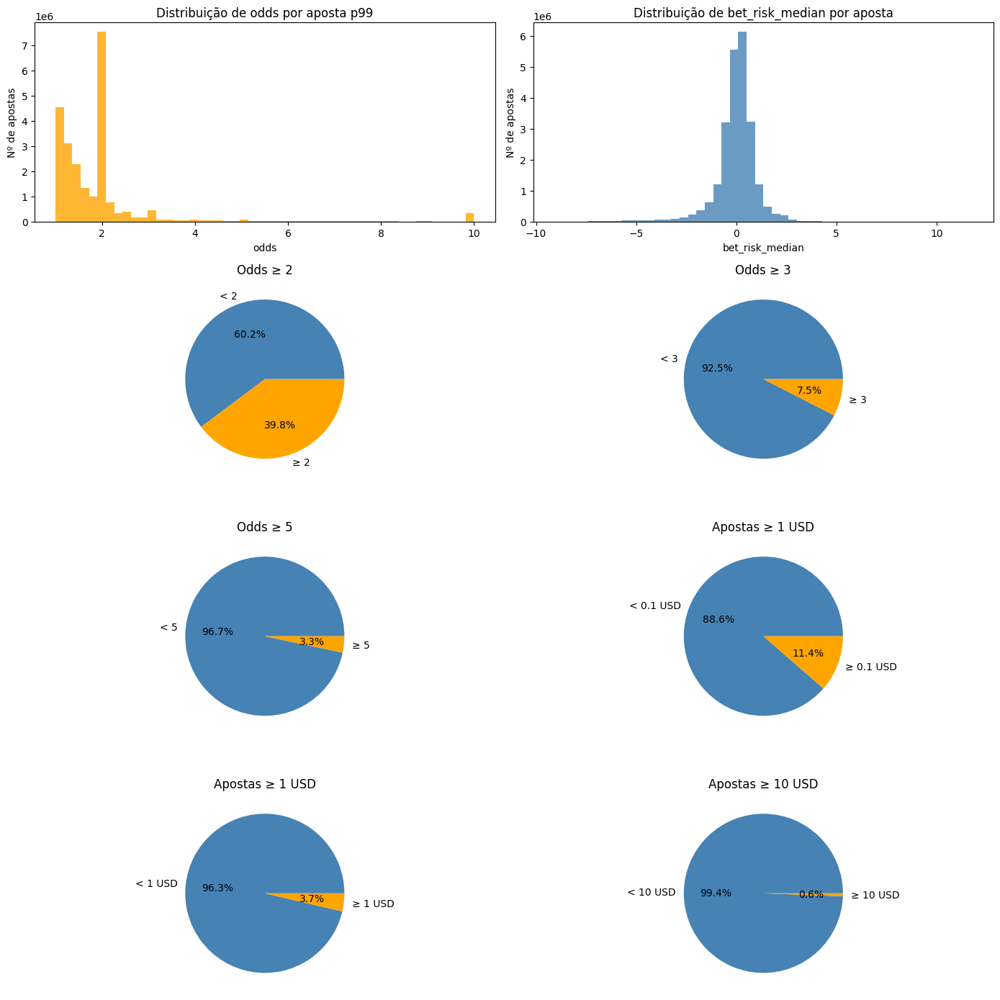

In [26]:
odd_more_than_2 = (df['odds_adjusted'] >= 2).astype(int)
odd_more_than_3 = (df['odds_adjusted'] >= 3).astype(int)
odd_more_than_5 = (df['odds_adjusted'] >= 5).astype(int)

bet_more_than_01USD = (df['fiat_bet_amount'] >= 0.1).astype(int)
bet_more_than_1USD = (df['fiat_bet_amount'] >= 1).astype(int)
bet_more_than_10USD = (df['fiat_bet_amount'] >= 10).astype(int)

fig, axs = plt.subplots(4, 2, figsize=(14, 14))

axs[0,1].hist(df['bet_risk'], bins=50, color="steelblue", alpha=0.8)
axs[0,1].set_title('Distribuição de bet_risk_median por aposta')
axs[0,1].set_xlabel('bet_risk_median')
axs[0,1].set_ylabel('Nº de apostas')

axs[0,0].hist(df['odds_adjusted'], bins=50, color="orange", alpha=0.8, range=(df['odds_adjusted'].quantile(0.00), df['odds_adjusted'].quantile(0.99)))
axs[0,0].set_title('Distribuição de odds por aposta p99')
axs[0,0].set_xlabel('odds')
axs[0,0].set_ylabel('Nº de apostas')

labels = ["< 2", "≥ 2"]
size = [ (odd_more_than_2==0).sum(), (odd_more_than_2==1).sum() ]
axs[1,0].pie(size, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs[1,0].set_title('Odds ≥ 2')

labels = ["< 3", "≥ 3"]
size = [ (odd_more_than_3==0).sum(), (odd_more_than_3==1).sum() ]
axs[1,1].pie(size, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs[1,1].set_title('Odds ≥ 3')

labels = ["< 5", "≥ 5"]
size = [ (odd_more_than_5==0).sum(), (odd_more_than_5==1).sum() ]
axs[2,0].pie(size, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs[2,0].set_title('Odds ≥ 5')

labels = ["< 0.1 USD", "≥ 0.1 USD"]
sizes = [ (bet_more_than_01USD==0).sum(), (bet_more_than_01USD==1).sum() ]
axs[2,1].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs[2,1].set_title('Apostas ≥ 1 USD')


labels = ["< 1 USD", "≥ 1 USD"]
sizes = [ (bet_more_than_1USD==0).sum(), (bet_more_than_1USD==1).sum() ]
axs[3,0].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs[3,0].set_title('Apostas ≥ 1 USD')


labels = ["< 10 USD", "≥ 10 USD"]
sizes = [ (bet_more_than_10USD==0).sum(), (bet_more_than_10USD==1).sum() ]
axs[3,1].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs[3,1].set_title('Apostas ≥ 10 USD')

plt.tight_layout()
plt.show()


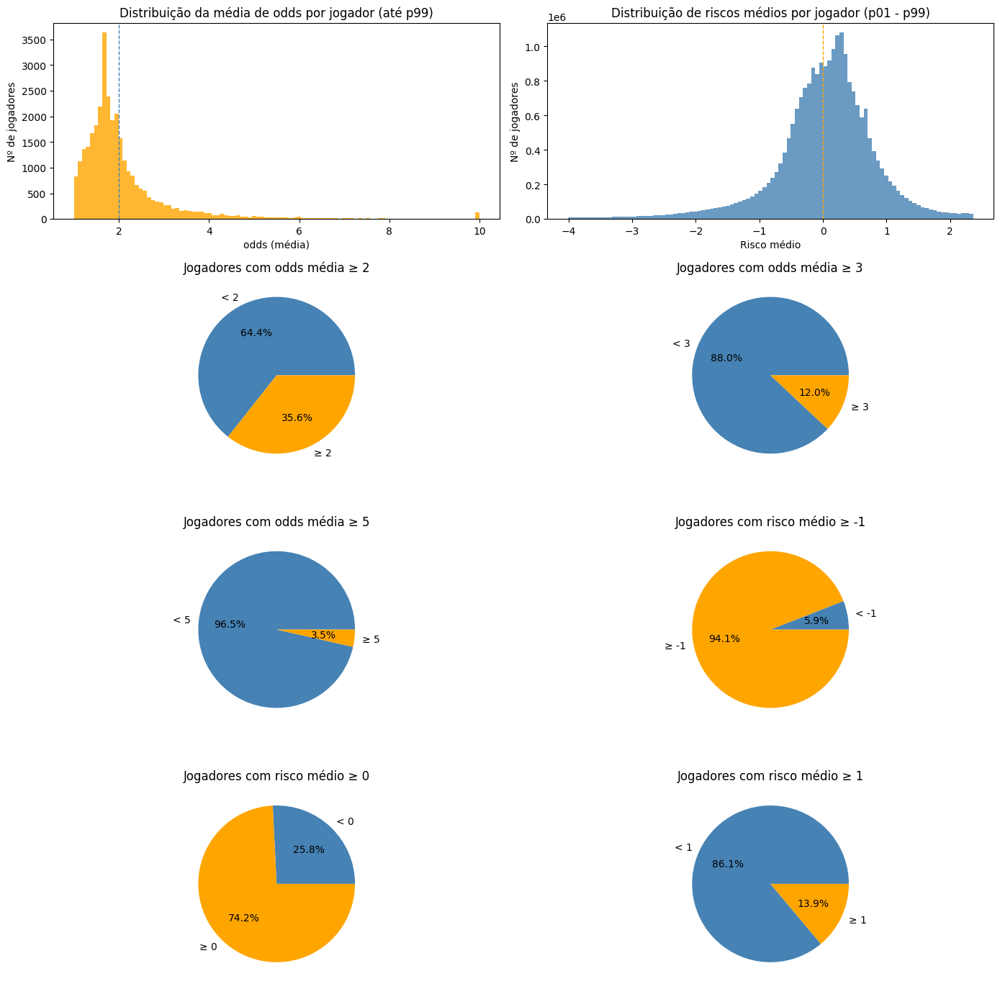

In [27]:
u = df.groupby('user_id', observed=True).agg({
    'odds_adjusted': 'mean',
    'fiat_bet_amount': 'mean',
    'bet_risk': 'mean'
})

user_odd_more_than_2 = (u['odds_adjusted'] >= 2).astype(int)
user_odd_more_than_3 = (u['odds_adjusted'] >= 3).astype(int)
user_odd_more_than_5 = (u['odds_adjusted'] >= 5).astype(int)

user_bet_more_than_m1R = (u['bet_risk'] >= -1).astype(int)
user_bet_more_than_0R = (u['bet_risk'] >= 0).astype(int)
user_bet_more_than_1R = (u['bet_risk'] >= 1).astype(int)

fig2, axs2 = plt.subplots(4, 2, figsize=(14, 14))


axs2[0,0].hist(u['odds_adjusted'], bins=100, color="orange", alpha=0.8, range=(u['odds_adjusted'].quantile(0.00), u['odds_adjusted'].quantile(0.99)))
axs2[0,0].set_title('Distribuição da média de odds por jogador (até p99)')
axs2[0,0].set_xlabel('odds (média)')
axs2[0,0].set_ylabel('Nº de jogadores')
axs2[0,0].axvline(x=2, color='steelblue', linestyle='--', linewidth=1)


axs2[0,1].hist(df['bet_risk'], bins=100, color="steelblue", alpha=0.8, range=(df['bet_risk'].quantile(0.01), df['bet_risk'].quantile(0.99)))
axs2[0,1].set_title('Distribuição de riscos médios por jogador (p01 - p99)')
axs2[0,1].set_xlabel('Risco médio')
axs2[0,1].set_ylabel('Nº de jogadores')
axs2[0,1].axvline(x=0, color='orange', linestyle='--', linewidth=1)



labels = ["< 2", "≥ 2"]
size = [ (user_odd_more_than_2==0).sum(), (user_odd_more_than_2==1).sum() ]
axs2[1,0].pie(size, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs2[1,0].set_title('Jogadores com odds média ≥ 2')

labels = ["< 3", "≥ 3"]
size = [ (user_odd_more_than_3==0).sum(), (user_odd_more_than_3==1).sum() ]
axs2[1,1].pie(size, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs2[1,1].set_title('Jogadores com odds média ≥ 3')

labels = ["< 5", "≥ 5"]
size = [ (user_odd_more_than_5==0).sum(), (user_odd_more_than_5==1).sum() ]
axs2[2,0].pie(size, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs2[2,0].set_title('Jogadores com odds média ≥ 5')

labels = ["< -1", "≥ -1"]
sizes = [ (user_bet_more_than_m1R==0).sum(), (user_bet_more_than_m1R==1).sum() ]
axs2[2,1].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs2[2,1].set_title('Jogadores com risco médio ≥ -1')

labels = ["< 0", "≥ 0"]
sizes = [ (user_bet_more_than_0R==0).sum(), (user_bet_more_than_0R==1).sum() ]
axs2[3,0].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs2[3,0].set_title('Jogadores com risco médio ≥ 0')

labels = ["< 1", "≥ 1"]
sizes = [ (user_bet_more_than_1R==0).sum(), (user_bet_more_than_1R==1).sum() ]
axs2[3,1].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['steelblue', 'orange'])
axs2[3,1].set_title('Jogadores com risco médio ≥ 1')

plt.tight_layout()
plt.show()


In [28]:

# users_with_10plus_bets = df['user_id'].value_counts()
# users_with_10plus_bets = users_with_10plus_bets[users_with_10plus_bets >= 10].index
# df = df[df['user_id'].isin(users_with_10plus_bets)]


In [32]:
df.head()


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,date,odds_adjusted,user_bet_amount_proportion,bet_risk,hour,day_of_week,day_of_year,week_of_year
0,2831698,44,212042687,0.000034,0.000001,2020-09-09 22:51:14,1.03,1.000000,-0.103505,22,2,253,37
1,2831768,44,212067364,0.000034,0.000001,2020-09-09 23:26:45,1.03,1.000000,-0.103505,23,2,253,37
2,2831820,44,212085405,0.000034,0.000003,2020-09-09 23:48:26,1.08,1.000000,-0.048888,23,2,253,37
3,2832628,44,212376980,0.000035,0.000024,2020-09-10 05:36:11,1.67,1.039625,0.464507,5,3,254,37
4,2832686,44,212397916,0.000140,0.000140,2020-09-10 06:01:38,2.00,4.156854,1.071484,6,3,254,37


In [33]:
m24 = (df.groupby(['user_id','day_of_year','hour'], observed=True)['bet_risk']
         .mean()
         .unstack('hour', fill_value=0))
m24 = m24.reindex(columns=list(range(24)), fill_value=0)


In [34]:
m24.head()


hour                  0    1    2    3    4         5         6    7    8   \
user_id day_of_year                                                          
44      253          0.0  0.0  0.0  0.0  0.0  0.000000  0.000000  0.0  0.0   
        254          0.0  0.0  0.0  0.0  0.0  0.464507  0.933426  0.0  0.0   
        255          0.0  0.0  0.0  0.0  0.0  0.000000  0.000000  0.0  0.0   
        257          0.0  0.0  0.0  0.0  0.0  0.000000  0.000000  0.0  0.0   
        259          0.0  0.0  0.0  0.0  0.0  0.000000  0.000000  0.0  0.0   

hour                  9   ...   14        15   16   17   18        19   20  \
user_id day_of_year       ...                                                
44      253          0.0  ...  0.0  0.000000  0.0  0.0  0.0  0.000000  0.0   
        254          0.0  ...  0.0  0.000000  0.0  0.0  0.0  0.000000  0.0   
        255          0.0  ...  0.0 -0.123401  0.0  0.0  0.0  0.000000  0.0   
        257          0.0  ...  0.0  0.000000  0.0  0.0  0.0 -0.116149  0.0   
        259          0.0  ...  0.0  0.000000  0.0  0.0  0.0  0.000000  0.0   

hour                  21        22        23  
user_id day_of_year                           
44      253          0.0 -0.103505 -0.076196  
        254          0.0  0.000000  0.000000  
        255          0.0  0.000000  0.000000  
        257          0.0  0.000000  0.000000  
        259          0.0 -0.047318  0.000000  

[5 rows x 24 columns]

In [35]:
m24.columns = [f'hour_{h:02d}' for h in m24.columns]


In [36]:
m24.head()


hour_00  hour_01  hour_02  hour_03  hour_04   hour_05  \
user_id day_of_year                                                          
44      253              0.0      0.0      0.0      0.0      0.0  0.000000   
        254              0.0      0.0      0.0      0.0      0.0  0.464507   
        255              0.0      0.0      0.0      0.0      0.0  0.000000   
        257              0.0      0.0      0.0      0.0      0.0  0.000000   
        259              0.0      0.0      0.0      0.0      0.0  0.000000   

                      hour_06  hour_07  hour_08  hour_09  ...  hour_14  \
user_id day_of_year                                       ...            
44      253          0.000000      0.0      0.0      0.0  ...      0.0   
        254          0.933426      0.0      0.0      0.0  ...      0.0   
        255          0.000000      0.0      0.0      0.0  ...      0.0   
        257          0.000000      0.0      0.0      0.0  ...      0.0   
        259          0.000000      0.0      0.0      0.0  ...      0.0   

                      hour_15  hour_16  hour_17  hour_18   hour_19  hour_20  \
user_id day_of_year                                                           
44      253          0.000000      0.0      0.0      0.0  0.000000      0.0   
        254          0.000000      0.0      0.0      0.0  0.000000      0.0   
        255         -0.123401      0.0      0.0      0.0  0.000000      0.0   
        257          0.000000      0.0      0.0      0.0 -0.116149      0.0   
        259          0.000000      0.0      0.0      0.0  0.000000      0.0   

                     hour_21   hour_22   hour_23  
user_id day_of_year                               
44      253              0.0 -0.103505 -0.076196  
        254              0.0  0.000000  0.000000  
        255              0.0  0.000000  0.000000  
        257              0.0  0.000000  0.000000  
        259              0.0 -0.047318  0.000000  

[5 rows x 24 columns]

In [50]:
df['gap_min'] = df.groupby('user_id')['date'].diff().dt.total_seconds().div(60)
threshold_min = 60
df['new_session'] = df['gap_min'].isna() | (df['gap_min'] > threshold_min)
df['session_id'] = df.groupby('user_id')['new_session'].cumsum().astype('int64')
df.drop(columns=['gap_min','new_session'], inplace=True)
df.head()


C:\Users\mathe\AppData\Local\Temp\ipykernel_21412\658023759.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['gap_min'] = df.groupby('user_id')['date'].diff().dt.total_seconds().div(60)
C:\Users\mathe\AppData\Local\Temp\ipykernel_21412\658023759.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['session_id'] = df.groupby('user_id')['new_session'].cumsum().astype('int64')


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,date,odds_adjusted,user_bet_amount_proportion,bet_risk,hour,day_of_week,day_of_year,week_of_year,session_id
0,2831698,44,212042687,0.000034,0.000001,2020-09-09 22:51:14,1.03,1.000000,-0.103505,22,2,253,37,1
1,2831768,44,212067364,0.000034,0.000001,2020-09-09 23:26:45,1.03,1.000000,-0.103505,23,2,253,37,1
2,2831820,44,212085405,0.000034,0.000003,2020-09-09 23:48:26,1.08,1.000000,-0.048888,23,2,253,37,1
3,2832628,44,212376980,0.000035,0.000024,2020-09-10 05:36:11,1.67,1.039625,0.464507,5,3,254,37,2
4,2832686,44,212397916,0.000140,0.000140,2020-09-10 06:01:38,2.00,4.156854,1.071484,6,3,254,37,2


In [51]:

basic = (df.groupby(['user_id','day_of_year'], observed=True)
           .agg(
               risk_mean=('bet_risk','mean'),
               risk_std=('bet_risk','std'),
               n_bets=('bet_id','size'),
               bet_sum=('fiat_bet_amount','sum'),
               profit_sum=('fiat_profit_amount','sum'),
               n_sessions=('session_id','nunique'),
           )
           .fillna(0.0)
           .astype('float32'))

basic.head()


risk_mean  risk_std  n_bets   bet_sum  profit_sum  \
user_id day_of_year                                                      
44      253          -0.085299  0.031533     3.0  0.000101    0.000005   
        254           0.839642  0.394039     5.0  0.000738    0.000445   
        255          -0.123401  0.000000     1.0  0.000037    0.000001   
        257          -0.002056  0.190662     4.0  0.000271    0.000008   
        259          -0.047318  0.119857    15.0  0.000565    0.000021   

                     n_sessions  
user_id day_of_year              
44      253                 1.0  
        254                 1.0  
        255                 1.0  
        257                 3.0  
        259                 1.0

In [38]:
# df.groupby('hour')['bet_risk'].sum().reindex(range(24), fill_value=0)



In [52]:
hours = np.arange(24)

def slope_dia(grp):
    y = (grp.groupby('hour')['bet_risk']
            .sum()
            .reindex(range(24), fill_value=0)
            .values)
    return float(linregress(hours, y).slope)

slope_per_day = (df
    .groupby(['user_id','day_of_year'], observed=True)
    .apply(slope_dia)
    .rename('slope_risk_day'))


In [53]:
slope_per_day.name = 'slope_risk_day'


In [54]:
slope_per_day.sort_values(ascending=False)


user_id  day_of_year
967686   273            32.319105
146999   258            29.457856
1407054  262            26.881803
965030   256            26.714336
865447   261            26.185279
                          ...    
1443590  264           -24.917911
1345362  254           -25.231699
1343144  262           -25.290940
115814   272           -25.438599
220550   266           -26.453304
Name: slope_risk_day, Length: 130644, dtype: float64

In [55]:
daily_features = (
    basic
    .join(m24)
    .join(slope_per_day)
    .reset_index()
)


In [56]:
daily_features = downcast_df(daily_features)
daily_features.head()


,user_id,day_of_year,risk_mean,risk_std,n_bets,bet_sum,profit_sum,n_sessions,hour_00,hour_01,...,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,slope_risk_day
0,44,253,-0.085299,0.031533,3.0,0.000101,0.000005,1.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,-0.103505,-0.076196,-0.002469
1,44,254,0.839642,0.394039,5.0,0.000738,0.000445,1.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,-0.020482
2,44,255,-0.123401,0.000000,1.0,0.000037,0.000001,1.0,0.0,0.0,...,-0.123401,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,-0.000376
3,44,257,-0.002056,0.190662,4.0,0.000271,0.000008,3.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,-0.116149,0.0,0.0,0.000000,0.000000,-0.000306
4,44,259,-0.047318,0.119857,15.0,0.000565,0.000021,1.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,-0.047318,0.000000,-0.006481


In [57]:
daily_features.columns


Index(['user_id', 'day_of_year', 'risk_mean', 'risk_std', 'n_bets', 'bet_sum',
       'profit_sum', 'n_sessions', 'hour_00', 'hour_01', 'hour_02', 'hour_03',
       'hour_04', 'hour_05', 'hour_06', 'hour_07', 'hour_08', 'hour_09',
       'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
       'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'slope_risk_day'],
      dtype='object')

In [58]:
daily = daily_features.copy()


In [59]:
past_bets = daily.groupby("user_id")["n_bets"].shift(1)

daily["user_daily_bet"] = (
    past_bets
    .groupby(daily["user_id"])
    .transform(lambda s: s.ewm(alpha=0.1, adjust=False).mean())
)
daily["user_daily_bet"] = daily["user_daily_bet"].fillna(
    daily.groupby("user_id")["n_bets"].transform("first")
)

daily["n_bet_proportion"] = daily["n_bets"] / daily["user_daily_bet"]


C:\Users\mathe\AppData\Local\Temp\ipykernel_21412\795915297.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past_bets = daily.groupby("user_id")["n_bets"].shift(1)
C:\Users\mathe\AppData\Local\Temp\ipykernel_21412\795915297.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(daily["user_id"])
C:\Users\mathe\AppData\Local\Temp\ipykernel_21412\795915297.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  daily

In [60]:
daily.drop(columns=['user_daily_bet','n_bets'], inplace=True)


In [61]:
daily.head()


,user_id,day_of_year,risk_mean,risk_std,bet_sum,profit_sum,n_sessions,hour_00,hour_01,hour_02,...,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,slope_risk_day,n_bet_proportion
0,44,253,-0.085299,0.031533,0.000101,0.000005,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,-0.103505,-0.076196,-0.002469,1.000000
1,44,254,0.839642,0.394039,0.000738,0.000445,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,-0.020482,1.666667
2,44,255,-0.123401,0.000000,0.000037,0.000001,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,-0.000376,0.312500
3,44,257,-0.002056,0.190662,0.000271,0.000008,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.116149,0.0,0.0,0.000000,0.000000,-0.000306,1.342282
4,44,259,-0.047318,0.119857,0.000565,0.000021,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,-0.047318,0.000000,-0.006481,4.866970


In [62]:
daily.columns


Index(['user_id', 'day_of_year', 'risk_mean', 'risk_std', 'bet_sum',
       'profit_sum', 'n_sessions', 'hour_00', 'hour_01', 'hour_02', 'hour_03',
       'hour_04', 'hour_05', 'hour_06', 'hour_07', 'hour_08', 'hour_09',
       'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
       'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'slope_risk_day', 'n_bet_proportion'],
      dtype='object')

In [63]:
features = [
        'risk_mean', 'risk_std', 
        # 'bet_sum','profit_sum',
        'n_sessions', 'hour_00', 'hour_01', 'hour_02', 'hour_03',
        'hour_04', 'hour_05', 'hour_06', 'hour_07', 'hour_08', 'hour_09',
        'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
        'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
        'hour_22', 'hour_23', 
        'slope_risk_day', 
        'n_bet_proportion'
       ]




In [65]:
X = daily[features]


In [66]:
X.iloc[0]


risk_mean          -0.085299
risk_std            0.031533
n_sessions          1.000000
hour_00             0.000000
hour_01             0.000000
hour_02             0.000000
hour_03             0.000000
hour_04             0.000000
hour_05             0.000000
hour_06             0.000000
hour_07             0.000000
hour_08             0.000000
hour_09             0.000000
hour_10             0.000000
hour_11             0.000000
hour_12             0.000000
hour_13             0.000000
hour_14             0.000000
hour_15             0.000000
hour_16             0.000000
hour_17             0.000000
hour_18             0.000000
hour_19             0.000000
hour_20             0.000000
hour_21             0.000000
hour_22            -0.103505
hour_23            -0.076196
slope_risk_day     -0.002469
n_bet_proportion    1.000000
Name: 0, dtype: float64

In [67]:
def scale_and_pca(X: pd.DataFrame, n_components: int = 3) -> pd.DataFrame:
    scaler = RobustScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=n_components, random_state=42)
    Xr = pca.fit_transform(X_scaled)
    return pd.DataFrame(Xr)


In [74]:
Xr = scale_and_pca(X, 0.95)


In [75]:
len(Xr)


130644

In [76]:
Xr.head()


,0,1
0,-1.420142,0.151830
1,-0.670331,-0.075979
2,-2.187809,0.165862
3,-1.030313,0.182992
4,2.895386,0.180436


In [85]:
def clip_outliers(df, lower_q=0.01, upper_q=0.99):
    df = df.copy()
    for col in df.columns:
        lo, hi = df[col].quantile([lower_q, upper_q])
        df[col] = df[col].clip(lo, hi)
    return df


In [86]:
train_df = clip_outliers(Xr)


In [87]:
import plotly.express as px

def plot_pca(X: pd.DataFrame) -> None:
    columns = X.columns
    n_dims = len(columns)

    if n_dims == 2:
        fig = px.scatter(
            X, x=columns[0], y=columns[1],
            opacity=0.2
        )
        fig.update_traces(marker=dict(size=3, color='blue'))
        fig.update_layout(title='PCA 2D', template='plotly_white')
        fig.show()
    elif n_dims == 3:
        fig = px.scatter_3d(
            X, x=columns[0], y=columns[1], z=columns[2],
            opacity=0.2
        )
        fig.update_traces(marker=dict(size=2, color='blue'))
        fig.update_layout(title='PCA 3D', template='plotly_white')
        fig.show()
    else:
        # No suitable plot for more than 3 dimensions
        print(f"Cannot plot data with {n_dims} dimensions.")


In [88]:
plot_pca(train_df)


In [89]:
s = setup(data=train_df, session_id=123)


,Description,Value
0,Session id,123
1,Original data shape,"(130644, 2)"
2,Transformed data shape,"(130644, 2)"
3,Numeric features,2
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


In [109]:
best = create_model("kmeans", num_clusters=7)
results = pull()


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6944,125043.8029,0.6221,0,0,0


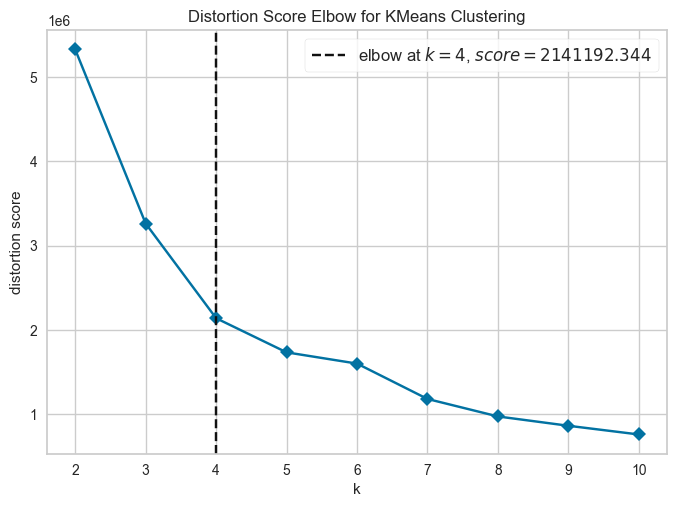

In [110]:
plot_model(best, plot="elbow")        
# plot_model(best, plot="silhouette")   
# plot_model(best, plot="cluster")


In [111]:
daily_clustered = assign_model(best)
daily_clustered["Cluster_num"] = (
    daily_clustered["Cluster"]
    .str.replace("Cluster ", "", regex=False)
    .astype(int)
)
labels = daily_clustered["Cluster_num"].values


In [112]:
set(labels)


{0, 1, 2, 3, 4, 5, 6}

In [113]:
pd.Series(labels).value_counts().sort_index()


0    106291
1      2748
2      2564
3      3046
4      7416
5       421
6      8158
Name: count, dtype: int64

In [114]:
plot_model(best, plot="cluster")


In [115]:
daily.columns


Index(['user_id', 'day_of_year', 'risk_mean', 'risk_std', 'bet_sum',
       'profit_sum', 'n_sessions', 'hour_00', 'hour_01', 'hour_02', 'hour_03',
       'hour_04', 'hour_05', 'hour_06', 'hour_07', 'hour_08', 'hour_09',
       'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
       'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'slope_risk_day', 'n_bet_proportion'],
      dtype='object')

In [116]:
cluster_labels = pd.Series(labels, name="cluster_label")
cluster_labels[0]

labeled = daily.copy()
labeled['cluster_label'] = cluster_labels


clusters = (labeled
    .groupby(['cluster_label'], observed=True)
    .agg(
        days = ('risk_mean', 'size'),
        risk_mean_mean   = ('risk_mean', 'mean'),
        risk_std_mean    = ('risk_std', 'mean'),
        n_sessions_mean  = ('n_sessions', 'mean'),
        slope_risk_day_mean = ('slope_risk_day', 'mean'),
        n_bet_proportion   = ('n_bet_proportion', 'mean'),
        

    )
    .reset_index()
)

clusters


,cluster_label,days,risk_mean_mean,risk_std_mean,n_sessions_mean,slope_risk_day_mean,n_bet_proportion
0,0,106291,0.072841,0.610052,1.582618,-0.002441,1.060126
1,1,2748,-0.675324,0.898187,2.303129,-3.151741,2.502155
2,2,2564,-0.824081,0.910796,2.159906,3.373512,8.490677
3,3,3046,0.084210,0.770953,2.223244,0.023304,33.943152
4,4,7416,-0.965857,0.950906,2.195523,0.660805,1.937584
5,5,421,-0.621507,0.890329,2.446556,-2.782248,46.591135
6,6,8158,-0.684823,0.894735,2.397401,-0.690263,2.118888


0 -> Media de risco maior e tambem um mad de risco maior, o que se arriscam mais que a maioria nos jgoos que participam, apostam uma quantidade normal
1 -> media de risco baixa, sao mais conservadores, e apostam menos que outros dias
2 -> risco normal, tudo dentro do normal, menos a quantidade de apostas, apostando um pouco mais que o normal
3 -> apostam MUITO mais que o normal
4 -> praticamente nao se arriscam, apostam uma quantidade normal, mas o risco que correm eh muito baixo
5 -> Talvez o dia considerado normal

conservador:
4, 1

normais:
5,  

intenso:
2,

anormais:
3, 0

In [118]:
labeled[labeled['user_id'] == 36674]


,user_id,day_of_year,risk_mean,risk_std,bet_sum,profit_sum,n_sessions,hour_00,hour_01,hour_02,...,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,slope_risk_day,n_bet_proportion,cluster_label
120,36674,253,0.817791,1.049447,411.174286,12.817691,5.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.458613,0.414878,0.000000,0.707214,1.091836,1.633424,1.000000,2
121,36674,254,0.923813,1.032771,841.982849,-67.565651,2.0,1.138616,1.025155,0.896294,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.502729,0.815891,-6.081905,1.434690,1
122,36674,255,0.902573,1.150210,65.677261,84.313011,1.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.762954,0.888485,0.909237,1.096587,3.679637,0.479171,2
123,36674,256,0.945266,1.121154,488.592102,56.366383,2.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.894004,0.566442,0.863867,1.123414,-0.192014,1.479693,0
124,36674,257,0.836188,0.780863,144.707306,-55.902714,2.0,0.721847,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.062519,0.176624,6
125,36674,258,0.801011,1.057377,172.489883,30.489788,2.0,0.000000,0.000000,0.402595,...,0.000000,0.000000,0.000000,0.000000,1.189573,0.528949,0.000000,-2.059774,0.697852,1
126,36674,259,0.944356,1.038599,483.811615,13.710238,1.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.308315,1.129299,1
127,36674,260,0.758426,0.974666,575.985840,-141.531601,1.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.546717,0.684816,0.916013,0.888895,3.468684,0.593535,2
128,36674,261,0.679719,1.119960,159.465012,27.915684,3.0,0.000000,0.048920,0.384172,...,0.000000,0.000000,0.000000,0.718837,0.488598,0.000000,0.000000,-2.339823,0.862334,1
129,36674,262,0.906027,1.098014,65.877777,45.466930,2.0,0.552950,1.042220,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.405357,0.819874,1


In [ ]:
df[(df['user_id'] == 44) & (df['date'].isin(['2020-09-19', '2020-09-21']))]


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,user_bet_amount_proportion,bet_risk,bet_risk_mad,date
datetime,,,,,,,,,,
2020-09-19 04:00:12,2863702,44,223464315,0.003832,-0.003832,1600488012,5.765655,1.155564,0.054351,2020-09-19
2020-09-19 04:00:12,2863703,44,223464702,0.383173,-0.383173,1600488012,550.338257,2.457825,0.413387,2020-09-19
2020-09-19 04:00:12,2863704,44,223464868,0.766346,-0.766346,1600488012,169.507416,2.119488,0.341908,2020-09-19
2020-09-19 04:00:12,2863705,44,223465475,1.532691,1.685961,1600488012,126.259018,2.203355,0.265508,2020-09-19
2020-09-19 04:00:12,2863706,44,223465813,0.383173,0.011495,1600488012,14.012649,1.252584,0.247543,2020-09-19
2020-09-19 04:00:12,2863707,44,223466196,0.383173,0.011495,1600488012,12.399186,1.212626,0.257284,2020-09-19
2020-09-19 04:00:12,2863710,44,223467387,0.000038,0.000001,1600488012,0.001113,-1.831108,-0.271764,2020-09-19
2020-09-19 04:00:12,2865142,44,223940389,0.000383,-0.000383,1600488012,0.011243,-1.085366,-0.168456,2020-09-19
2020-09-19 04:00:12,2865143,44,223940869,0.000383,0.000011,1600488012,0.011355,-1.072465,-0.211877,2020-09-19


In [ ]:
def train(Xr: pd.DataFrame, min_cluster_size: int = 500, min_samples: int = 12, method: str = "eom", plot=False) -> pd.Series:
    hdb = hdbscan.HDBSCAN(
        min_cluster_size=min_cluster_size,        
        min_samples=min_samples,             
        metric="euclidean",
        cluster_selection_method=method,
        # cluster_selection_epsilon=0.1,
        core_dist_n_jobs=-1,
        prediction_data=True
    )
    labels = hdb.fit_predict(Xr)
    mask = labels != -1
    sil = silhouette_score(X[mask], labels[mask]) if mask.any() else None
    print({"n_clusters": len(set(labels)) - (1 if -1 in labels else 0),
        "pct_ruido": float(np.mean(~mask)),
        "silhouette": sil})
    if plot:
        ax = hdb.condensed_tree_.plot(select_clusters=True)
        plt.show()


    return labels, hdb


In [ ]:
from itertools import product

size = [100, 250, 500, 1000, 2000, 5000]
samples = [3, 6, 12, 24, 32, 48, 72]
method = ['eom', 'leaf']

combinations = list(product(size, samples, method))
for combination in combinations:
    print(combination)
    labels, hdb = train(Xr, *combination, plot=False)



(100, 3, 'eom')
{'n_clusters': 88, 'pct_ruido': 0.7998125571355043, 'silhouette': 0.0314729305731059}
(100, 3, 'leaf')
{'n_clusters': 120, 'pct_ruido': 0.8424942192313306, 'silhouette': 0.26082050203708257}
(100, 6, 'eom')
{'n_clusters': 44, 'pct_ruido': 0.8364484186428829, 'silhouette': -0.03241331144561569}
(100, 6, 'leaf')
{'n_clusters': 79, 'pct_ruido': 0.898734760664654, 'silhouette': 0.3602526412939815}
(100, 12, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.023307444708196016, 'silhouette': 0.9353459389302758}
(100, 12, 'leaf')
{'n_clusters': 56, 'pct_ruido': 0.9219961128651871, 'silhouette': 0.39871570813223084}
(100, 24, 'eom')
{'n_clusters': 14, 'pct_ruido': 0.871025481474653, 'silhouette': 0.07749666822429109}
(100, 24, 'leaf')
{'n_clusters': 37, 'pct_ruido': 0.9449194533428591, 'silhouette': 0.4648817511674978}
(100, 32, 'eom')
{'n_clusters': 8, 'pct_ruido': 0.7680471372711699, 'silhouette': 0.3392669592477116}
(100, 32, 'leaf')
{'n_clusters': 33, 'pct_ruido': 0.9483379809945227,

In [ ]:
size = [10000, 20000]
samples = [32, 48, 72, 144]
method = ['eom']

combinations = list(product(size, samples, method))
for combination in combinations:
    print(combination)
    labels, hdb = train(Xr, *combination, plot=False)


In [ ]:
labels, hdb = train(Xr,10000, 144, 'eom', plot=True)
# labels, hdb = train(Xr,100, 12, 'eom', plot=True)



NameError: name 'train' is not defined

In [ ]:
def plot_clusters(X: pd.DataFrame, labels: pd.Series) -> None:
    labels_s = pd.Series(labels, name='cluster')
    plot_df = X.join(labels_s, how='left')

    plot_df['cluster_name'] = np.where(plot_df['cluster'] == -1, 'Ruído',
                                        'C' + plot_df['cluster'].astype(str))
    
    color_map = {'Ruído': '#9e9e9e',
                 'C1': '#1f77b4',
                 'C2': '#ff7f0e',
                 'C3': '#2ca02c',
                 'C4': '#d62728',
                 'C5': '#9467bd',
                 'C6': '#8c564b',
                 'C7': '#e377c2'}

    columns = X.columns
    n_dims = len(columns)
    
    if n_dims == 2:
        # 2D scatter
        fig = px.scatter(
            plot_df, x=columns[0], y=columns[1],
            color='cluster_name', opacity=0.10,
            color_discrete_map=color_map
        )
        fig.update_traces(marker=dict(size=3))
        fig.update_layout(title='PCA 2D por cluster', template='plotly_white')
    elif n_dims >= 3:
        # 3D scatter, only take first three columns
        fig = px.scatter_3d(
            plot_df, x=columns[0], y=columns[1], z=columns[2],
            color='cluster_name', opacity=0.10,
            color_discrete_map=color_map
        )
        fig.update_traces(marker=dict(size=1))
        fig.update_layout(title='PCA 3D por cluster', template='plotly_white')
    else:
        raise ValueError("Input data must have at least 2 columns for plotting.")

    fig.show()


In [ ]:

plot_clusters(filtered_df,labels)


In [ ]:
def threshold_clusters(labels: pd.Series, hdb: hdbscan.HDBSCAN, threshold: float = 0.3) -> pd.Series:
    soft = prediction.all_points_membership_vectors(hdb)
    
    max_prob = soft.max(axis=1)
    argmax = soft.argmax(axis=1)
    
    labels_thresholded = labels.copy()
    mask_ruido = labels == -1
    labels_thresholded[mask_ruido & (max_prob >= threshold)] = argmax[mask_ruido & (max_prob >= threshold)]

    return labels_thresholded


In [ ]:
labels_thresholded = threshold_clusters(labels, hdb, 0.3)
plot_clusters(filtered_df,labels_thresholded)


In [ ]:
labels_thresholded = threshold_clusters(labels, hdb, 0.5)
plot_clusters(filtered_df,labels_thresholded)


In [ ]:
pd.Series(labels_thresholded).value_counts().sort_index()


-1      1615
 0       585
 1    127973
Name: count, dtype: int64

In [ ]:
daily.head()


,user_id,date,risk_mean,risk_median,risk_std,risk_max,risk_p95,risk_mad_mean,risk_mad_median,risk_mad_std,...,bet_std,profit_sum,bet_prop_mean,bet_prop_median,bet_prop_std,bet_prop_max,odds_mean,odds_max,odds_std,n_bet_proportion
0,44,2020-09-09,0.395426,0.390265,0.008939,0.405749,0.404200,-0.011850,-0.016374,0.065323,...,0.000000,0.000005,1.000000,1.000000,0.000000,1.000000,1.046667,1.08,0.028868,1.000000
1,44,2020-09-10,0.962010,1.030946,0.268029,1.278913,1.237612,0.134200,0.148884,0.055431,...,0.000087,0.000445,4.141957,4.029644,2.419359,7.822300,1.754000,2.00,0.392530,1.666667
2,44,2020-09-11,0.367703,0.367703,0.000000,0.367703,0.367703,0.002798,0.002798,0.000000,...,0.000000,0.000001,0.933260,0.933260,0.000000,0.933260,1.030000,1.03,0.000000,0.312500
3,44,2020-09-13,0.498473,0.391469,0.224619,0.835028,0.769898,0.020656,0.021905,0.036380,...,0.000058,0.000008,1.716950,0.984977,1.482621,3.940794,1.037500,1.08,0.028723,1.342282
4,44,2020-09-15,0.389442,0.375759,0.033961,0.467090,0.466823,0.074034,0.070790,0.061930,...,0.000000,0.000021,0.933912,0.933962,0.002774,0.938171,1.106000,1.40,0.124774,4.866970


In [ ]:

cluster_labels = pd.Series(labels, name="cluster_label")
cluster_labels[0]


0

In [ ]:
labeled[labeled['cluster_label'] == 0].head()


,user_id,date,risk_mean,risk_median,risk_std,risk_max,risk_p95,risk_mad_mean,risk_mad_median,risk_mad_std,risk_mad_max,n_bet_proportion,cluster_label
0,44,2020-09-09,0.395426,0.390265,0.008939,0.405749,0.404200,-0.011850,-0.016374,0.065323,0.055617,1.000000,0.0
1,44,2020-09-10,0.962010,1.030946,0.268029,1.278913,1.237612,0.134200,0.148884,0.055431,0.189527,1.666667,0.0
2,44,2020-09-11,0.367703,0.367703,0.000000,0.367703,0.367703,0.002798,0.002798,0.000000,0.002798,0.312500,0.0
3,44,2020-09-13,0.498473,0.391469,0.224619,0.835028,0.769898,0.020656,0.021905,0.036380,0.052539,1.342282,0.0
5,44,2020-09-17,1.693551,1.660445,0.177635,1.885410,1.862913,0.328698,0.385724,0.122245,0.412010,0.701951,0.0


In [ ]:

clusters = (labeled
    .groupby(['cluster_label'], observed=True)
    .agg(
        days = ('risk_mean', 'size'),
        risk_mean_mean   = ('risk_mean', 'mean'),
        risk_median_mean = ('risk_median', 'mean'),
        risk_std_mean    = ('risk_std', 'mean'),
        risk_max_mean = ('risk_max', 'mean'),
        risk_p95_mean = ('risk_p95', 'mean'),
        
        risk_mad_mean_mean   = ('risk_mad_mean', 'mean'),
        risk_mad_median_mean = ('risk_mad_median', 'mean'),
        risk_mad_std_mean    = ('risk_mad_std', 'mean'),
        
        n_bet_proportion   = ('n_bet_proportion', 'mean'),
        
        # n_bets_mean      = ('n_bets', 'mean'),
        # # n_games     = ('game_id', 'nunique'),
        # bet_sum_mean     = ('bet_sum', 'mean'),
        # bet_mean_mean    = ('bet_mean', 'mean'),
        # bet_max_mean    = ('bet_max', 'mean'),
        # profit_sum_mean  = ('profit_sum', 'mean'),
        
        # odds_mean_mean   = ('odds_mean', 'mean'),
        # odds_max_mean    = ('odds_max', 'mean'),
        # day_prop_mean   = ('bet_proportion_weighted', 'mean'),
    )
    .reset_index()
)




In [ ]:
clusters


,cluster_label,days,risk_mean_mean,risk_median_mean,risk_std_mean,risk_max_mean,risk_p95_mean,risk_mad_mean_mean,risk_mad_median_mean,risk_mad_std_mean,n_bet_proportion
0,0.0,108065,-0.090417,-0.075031,0.589989,0.962822,0.624012,-0.047964,-0.040146,0.128121,2.095084
1,1.0,7571,-0.113928,-0.096377,0.596826,0.946821,0.609018,-0.051267,-0.043160,0.128066,2.017504
2,2.0,11938,-0.124645,-0.108038,0.595885,0.945797,0.597925,-0.055519,-0.047087,0.129937,2.015392
3,3.0,1748,-0.094372,-0.070138,0.599295,0.981497,0.643647,-0.051640,-0.041691,0.129280,1.823729


In [ ]:
X2 = labeled[labeled['cluster_label'] == -1]
X2 = X2[features]
X2


,risk_mad_mean,risk_mad_median,risk_mad_std,risk_mad_max,n_bet_proportion
1,0.134200,0.148884,0.055431,0.189527,1.666667
4,0.074034,0.070790,0.061930,0.157794,4.866970
5,0.328698,0.385724,0.122245,0.412010,0.701951
6,0.186208,0.169041,0.201317,0.596304,2.411719
7,0.074636,0.150947,0.260998,0.413387,2.113370
...,...,...,...,...,...
130119,-0.239416,-0.313449,0.231880,0.332863,1.000000
130134,0.418043,0.418043,0.578336,0.826988,1.000000
130145,-0.511168,-0.584291,0.244812,0.214867,1.000000
130155,0.385944,0.240506,0.391353,0.956675,1.000000


In [ ]:
Xr2 = scale_and_pca(X2, 3)
Xr2_out = remove_outliers(Xr2)
plot_pca(Xr2_out)


In [ ]:
labels, hdb2 = train(Xr2, 2500, 36, 'eom', plot=True)
plot_clusters(Xr2, labels)


ValueError: Item wrong length 47223 instead of 130173.

In [ ]:
labels_thresholded = threshold_clusters(labels, hdb2)
plot_clusters(Xr2, labels_thresholded)


In [ ]:
Xr2 = PCA(n_components=0.95, random_state=42).fit_transform(
    StandardScaler().fit_transform(X2)
)
Xr2[0]


array([ 1.37110194, -0.55259303,  0.61080993,  0.46076637])

In [ ]:
hdb2 = hdbscan.HDBSCAN(
    min_cluster_size=200,        
    min_samples=8,             
    metric="euclidean",
    cluster_selection_method="leaf",
    core_dist_n_jobs=-1,  
    prediction_data=False     
)


In [ ]:
labels = hdb2.fit_predict(Xr2)

mask = labels != -1
sil = silhouette_score(X2[mask], labels[mask]) if mask.any() else None
print({"n_clusters": len(set(labels)) - (1 if -1 in labels else 0),
       "pct_ruido": float(np.mean(~mask)),
       "silhouette": sil})




{'n_clusters': 8, 'pct_ruido': 0.916609867716404, 'silhouette': 0.2603738173386951}


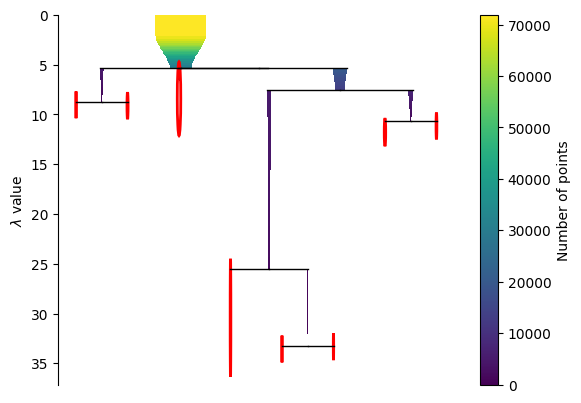

In [ ]:
pd.Series(labels).value_counts().sort_index()
ax = hdb2.condensed_tree_.plot(select_clusters=True)
plt.show()


In [ ]:
# results = []

# for k in range(2, 5):
#     km = KMeans(
#         n_clusters=k,
#         random_state=42,
#         n_init="auto",
#     )
#     labels = km.fit_predict(X_scaled)
#     inertia = km.inertia_
    
#     sil = silhouette_score(X_scaled, labels)
#     results.append((k, inertia, sil))

# results_df = pd.DataFrame(results, columns=["k", "inertia", "silhouette"])
# print(results_df)


   k       inertia  silhouette
0  2  1.864552e+06    0.991661
1  3  1.408959e+06    0.462717
2  4  1.270026e+06    0.359156


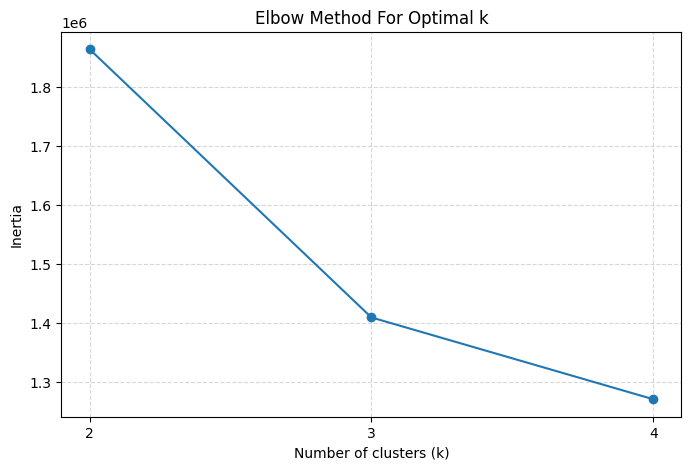

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(results_df["k"], results_df["inertia"], marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method For Optimal k")
plt.xticks(results_df["k"])
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()



In [ ]:
SEGSDGSDG


NameError: name 'SEGSDGSDG' is not defined

In [ ]:
players = daily.groupby('user_id').agg(
    avg_risk = ('risk', 'mean')
)


In [ ]:
def plot_user_risk(daily: pd.DataFrame, user_id: int):
  u = daily[daily.user_id==user_id].sort_values("date")
  plt.figure(figsize=(16,6))
  plt.plot(u["date"], u["risk"],label="Risk", color="#1f77b4", linewidth=1.8, marker='o')
  plt.title("risk")
  plt.grid(True, linestyle="--", alpha=0.3)
  plt.legend()
  plt.tight_layout()
  plt.show()


In [ ]:
g = df.groupby('user_id')
df['risk_next'] = g['risk'].shift(-1)
df = df.dropna(subset=['risk_next'])


C:\Users\mathe\AppData\Local\Temp\ipykernel_8932\730150144.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  g = df.groupby('user_id')


In [ ]:
del g
gc.collect()


0

In [ ]:
df.sort_values(by=['user_id'], ascending=True)


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,saldo,n_aposta,risk,global_avg_game_bet_amount,...,risk_50_mean_games,risk_50_std_games,risk_50_median_games,risk_100_mean_games,risk_100_std_games,risk_100_median_games,risk_200_mean_games,risk_200_std_games,risk_200_median_games,risk_next
9937162,2860133,44,222184751,3.887975e-05,3.032620e-05,1600401615,0.003653,37,-0.384217,0.351370,...,0.287597,0.502659,0.046810,0.287597,0.502659,0.046810,0.287597,0.502659,0.046810,0.694334
16112554,2879418,44,229158128,3.210774e-05,-3.210774e-05,1600920009,0.560952,59,-1.499871,0.248493,...,0.026708,1.019575,0.019166,0.087721,0.962287,0.026665,0.087721,0.962287,0.026665,-2.017472
7256758,2851786,44,219113840,3.763946e-05,1.467939e-05,1600142423,0.000473,25,0.210798,0.122415,...,0.197758,0.322475,0.026665,0.197758,0.322475,0.026665,0.197758,0.322475,0.026665,0.072197
1308185,2832686,44,212397916,1.404929e-04,1.404929e-04,1599710467,0.000169,5,0.912631,0.129546,...,0.275704,0.385344,0.053873,0.275704,0.385344,0.053873,0.275704,0.385344,0.053873,0.484821
7256474,2851785,44,219113483,3.763946e-05,3.763946e-06,1600142423,0.000458,24,0.046810,0.490751,...,0.197214,0.329399,0.023678,0.197214,0.329399,0.023678,0.197214,0.329399,0.023678,0.210798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23334113,2899994,1503513,237079156,2.605529e-02,-2.605529e-02,1601438402,-0.014844,4,1.364282,0.493351,...,0.928678,0.891669,0.813049,0.928678,0.891669,0.813049,0.928678,0.891669,0.813049,1.034682
23333744,2899993,1503513,237079093,2.605529e-02,1.146433e-02,1601438402,0.011212,3,1.972753,0.345826,...,0.783477,1.032526,0.261817,0.783477,1.032526,0.261817,0.783477,1.032526,0.261817,1.364282
23333002,2899991,1503513,237078064,8.418509e-05,-8.418509e-05,1601438402,-0.000084,1,0.115860,0.143022,...,0.115860,NaN,0.115860,0.115860,NaN,0.115860,0.115860,NaN,0.115860,0.261817
23330795,2899985,1503516,237076030,2.671013e-10,-2.671013e-10,1601438402,-0.080130,2,-5.370585,0.153889,...,-2.674947,3.812208,-2.674947,-2.674947,3.812208,-2.674947,-2.674947,3.812208,-2.674947,-1.122952
